In [1]:
import matplotlib.dates as mdates
import datetime
from tqdm import tqdm
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.optimize import minimize
import cufflinks as cf
import plotly.graph_objects as go
cf.go_offline()
cf.set_config_file(offline = True)
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm
import seaborn as sns
%matplotlib inline
import yfinance as yf

import warnings
warnings.filterwarnings('ignore')

In [2]:
ticker = ("MSFT","JPM", "XOM", "NEE","PG")

In [3]:
df = yf.download(ticker, period = '10y')

[*********************100%***********************]  5 of 5 completed


In [4]:
df.head()

Adj Close                                                  Close  \
                  JPM       MSFT        NEE         PG        XOM        JPM   
Date                                                                           
2013-08-12  40.915031  27.391083  16.536764  61.126499  59.082703  54.090000   
2013-08-13  41.066319  27.047022  16.442091  61.156448  58.760616  54.290001   
2013-08-14  40.960430  27.147720  16.310711  60.849400  58.464848  54.150002   
2013-08-15  40.309902  26.677782  16.036348  60.272743  57.945606  53.290001   
2013-08-16  40.309902  26.686165  15.872130  59.838375  57.781303  53.290001   

                                                        ...       Open  \
                 MSFT        NEE         PG        XOM  ...        JPM   
Date                                                    ...              
2013-08-12  32.869999  21.397499  81.620003  89.889999  ...  54.040001   
2013-08-13  32.230000  21.275000  81.660004  89.400002  ...  54.220001   
2013-08-14  32.349998  21.105000  81.250000  88.949997  ...  54.330002   
2013-08-15  31.790001  20.750000  80.480003  88.160004  ...  53.520000   
2013-08-16  31.799999  20.537500  79.900002  87.910004  ...  53.070000   

                                                          Volume            \
                 MSFT        NEE         PG        XOM       JPM      MSFT   
Date                                                                         
2013-08-12  32.459999  21.500000  81.230003  90.430000  15133000  25493700   
2013-08-13  32.509998  21.434999  81.779999  89.849998  15078100  39464100   
2013-08-14  32.139999  21.232500  81.669998  89.339996  15785800  48519600   
2013-08-15  32.000000  20.980000  80.959999  88.660004  16933200  33338000   
2013-08-16  31.790001  20.780001  80.269997  88.010002  17139000  32866300   

                                         
                 NEE       PG       XOM  
Date                                     
2013-08-12   3780800  4922200  10133700  
2013-08-13   4096400  4936400  10892700  
2013-08-14   5932400  5167500   9797300  
2013-08-15   5862800  7415300  11273400  
2013-08-16  10182000  9451600  11872500  

[5 rows x 30 columns]

## EDA [Exploratory Data Analysis]

In [5]:
#Checking if there are any missing Values
df.isnull().sum()

Adj Close  JPM     0
           MSFT    0
           NEE     0
           PG      0
           XOM     0
Close      JPM     0
           MSFT    0
           NEE     0
           PG      0
           XOM     0
High       JPM     0
           MSFT    0
           NEE     0
           PG      0
           XOM     0
Low        JPM     0
           MSFT    0
           NEE     0
           PG      0
           XOM     0
Open       JPM     0
           MSFT    0
           NEE     0
           PG      0
           XOM     0
Volume     JPM     0
           MSFT    0
           NEE     0
           PG      0
           XOM     0
dtype: int64

In [6]:
df.isnull().values.any()

False

In [7]:
#generate descriptive statistics that summarize the central tendency, dispersion and shape of a dataset's distribution, excluding NaN values
df.describe()

Adj Close                                                      \
               JPM         MSFT          NEE           PG          XOM   
count  2516.000000  2516.000000  2516.000000  2516.000000  2516.000000   
mean     88.920109   132.912597    45.062855    94.790634    63.535098   
std      35.529584    96.849511    23.197947    32.191161    17.235539   
min      38.063328    26.140690    15.388762    54.238667    26.335976   
25%      52.529263    46.832230    23.629342    66.744003    56.791098   
50%      90.322594    98.300354    38.058613    78.195629    60.792816   
75%     115.951448   224.445618    70.402195   127.697834    65.110935   
max     162.897034   359.489990    90.244301   158.212952   117.321945   

             Close                                                      ...  \
               JPM         MSFT          NEE           PG          XOM  ...   
count  2516.000000  2516.000000  2516.000000  2516.000000  2516.000000  ...   
mean    100.020914   137.675799    48.932060   106.350982    79.744960  ...   
std      33.451887    95.858136    22.280242    27.732533    17.919925  ...   
min      50.320000    31.150000    19.750000    68.059998    31.450001  ...   
25%      64.959999    52.127501    28.145000    82.339996    71.742500  ...   
50%     101.549999   103.090000    42.326250    91.385002    82.050003  ...   
75%     124.820002   227.637497    73.269997   135.549995    90.282499  ...   
max     171.779999   359.489990    93.360001   164.210007   119.169998  ...   

              Open                                                      \
               JPM         MSFT          NEE           PG          XOM   
count  2516.000000  2516.000000  2516.000000  2516.000000  2516.000000   
mean    100.015437   137.627635    48.923616   106.311550    79.731526   
std      33.456078    95.834115    22.299124    27.713915    17.881274   
min      50.220001    31.100000    19.712500    68.019997    31.410000   
25%      64.797503    52.079999    28.085626    82.230003    71.752497   
50%     101.710003   103.410000    42.271250    91.329998    82.079998   
75%     124.430000   228.022499    73.224377   135.557503    90.195002   
max     172.710007   361.750000    93.419998   164.399994   117.720001   

             Volume                                                          
                JPM          MSFT           NEE            PG           XOM  
count  2.516000e+03  2.516000e+03  2.516000e+03  2.516000e+03  2.516000e+03  
mean   1.501425e+07  3.104922e+07  8.259166e+06  8.330207e+06  1.673510e+07  
std    6.543365e+06  1.528608e+07  3.492976e+06  5.368706e+06  9.414467e+06  
min    3.220500e+06  7.425600e+06  1.387500e+06  2.022100e+06  3.851300e+06  
25%    1.075522e+07  2.214332e+07  6.012750e+06  6.003425e+06  1.028112e+07  
50%    1.344265e+07  2.742470e+07  7.484200e+06  7.229400e+06  1.391180e+07  
75%    1.732735e+07  3.528402e+07  9.416825e+06  9.202600e+06  2.002260e+07  
max    5.619230e+07  2.254938e+08  3.172000e+07  1.237357e+08  8.443940e+07  

[8 rows x 30 columns]

In [8]:
df_adj_close = df['Adj Close']

In [9]:
df_adj_close.head()

,JPM,MSFT,NEE,PG,XOM
Date,,,,,
2013-08-12,40.915031,27.391083,16.536764,61.126499,59.082703
2013-08-13,41.066319,27.047022,16.442091,61.156448,58.760616
2013-08-14,40.960430,27.147720,16.310711,60.849400,58.464848
2013-08-15,40.309902,26.677782,16.036348,60.272743,57.945606
2013-08-16,40.309902,26.686165,15.872130,59.838375,57.781303


In [10]:
df_adj_close.iplot(title = 'Price Change between 2013 and 2023')

In [11]:
#Calculate daily return change
ret = df_adj_close.pct_change()
ret.iplot(colors = 'Blue',title = 'Daily Return Between 2013 and 2023')

In [12]:
#This function is calculated for the annual risk and return for stocks
def ann_risk_return(returns_df):
    summary = returns_df.agg(['mean', 'std']).T
    summary.columns = ['Return', "Risk"]
    summary.Return = summary.Return*252
    summary.Risk = summary.Risk * np.sqrt(252)
    return summary

In [13]:
summary = ann_risk_return(ret)
summary

,Return,Risk
JPM,0.169208,0.270541
MSFT,0.284183,0.272509
NEE,0.168858,0.227016
PG,0.111020,0.182128
XOM,0.099349,0.273768


In [14]:
stocks_monthly_price = df_adj_close.resample('M',kind='period').last()
ret_month = stocks_monthly_price.pct_change().dropna()
month_cum_ret = (1+ret_month).cumprod()
month_cum_ret.iplot(color = 'Red')

## Moving Average Comparison for 50 , 100 , 200 days

In [15]:
def cal_sma50_sma100_sma200(df):
    stocks_SMA= pd.DataFrame()
    for stock in df.columns:
        stocks_SMA['{}'.format(stock)] = df[stock]
        stocks_SMA["{} SMA50".format(stock)]=df[stock].rolling(window = 50).mean()
        stocks_SMA["{} SMA100".format(stock)]=df[stock].rolling(window = 100).mean()
        stocks_SMA["{} SMA200".format(stock)]=df[stock].rolling(window = 200).mean()
    return stocks_SMA


In [16]:
cal_sma50_sma100_sma200(df_adj_close)

,JPM,JPM SMA50,JPM SMA100,JPM SMA200,MSFT,MSFT SMA50,MSFT SMA100,MSFT SMA200,NEE,NEE SMA50,NEE SMA100,NEE SMA200,PG,PG SMA50,PG SMA100,PG SMA200,XOM,XOM SMA50,XOM SMA100,XOM SMA200
Date,,,,,,,,,,,,,,,,,,,,
2013-08-12,40.915031,NaN,NaN,NaN,27.391083,NaN,NaN,NaN,16.536764,NaN,NaN,NaN,61.126499,NaN,NaN,NaN,59.082703,NaN,NaN,NaN
2013-08-13,41.066319,NaN,NaN,NaN,27.047022,NaN,NaN,NaN,16.442091,NaN,NaN,NaN,61.156448,NaN,NaN,NaN,58.760616,NaN,NaN,NaN
2013-08-14,40.960430,NaN,NaN,NaN,27.147720,NaN,NaN,NaN,16.310711,NaN,NaN,NaN,60.849400,NaN,NaN,NaN,58.464848,NaN,NaN,NaN
2013-08-15,40.309902,NaN,NaN,NaN,26.677782,NaN,NaN,NaN,16.036348,NaN,NaN,NaN,60.272743,NaN,NaN,NaN,57.945606,NaN,NaN,NaN
2013-08-16,40.309902,NaN,NaN,NaN,26.686165,NaN,NaN,NaN,15.872130,NaN,NaN,NaN,59.838375,NaN,NaN,NaN,57.781303,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-08-03,156.350006,145.056011,138.739342,135.472307,326.660004,335.994999,313.434074,278.398226,70.099998,73.638713,74.831304,76.653458,157.000000,148.634635,148.996656,144.650631,107.120003,105.029401,107.073291,107.859160
2023-08-04,156.020004,145.463244,139.006145,135.685724,327.779999,336.245399,314.178213,278.858349,69.169998,73.548371,74.794778,76.637592,155.279999,148.807712,149.185246,144.806578,107.419998,105.049801,107.091256,107.905250
2023-08-07,156.759995,145.910107,139.247139,135.888266,330.109985,336.570599,314.877101,279.325309,68.639999,73.445840,74.740432,76.612151,156.919998,149.037836,149.373349,144.965707,107.199997,105.042001,107.103056,107.949361


In [17]:
moving_avg = cal_sma50_sma100_sma200(df_adj_close)
moving_avg.iplot(title = 'Comparison the moving averages')

## Annual Return Triangle

In [18]:
annual = df_adj_close.resample("A", kind = "period").last()
annual

,JPM,MSFT,NEE,PG,XOM
Date,,,,,
2013,44.561642,31.632113,16.807144,61.445927,66.969086
2014,48.965580,40.351353,21.499857,70.923256,62.913483
2015,53.065254,49.507851,21.661270,63.852539,54.865723
2016,71.392075,56.972515,25.653400,69.829315,65.774193
2017,90.495674,80.177765,34.477135,78.694321,63.270222
2018,84.501434,96.850952,39.408646,81.503349,53.720654
2019,124.434296,152.596542,56.230572,113.860527,57.606194
2020,117.547165,217.502060,73.135902,129.974686,36.746395
2021,150.161530,331.640411,90.244301,156.648193,57.903328


In [19]:
annual_log_ret = np.log(annual/annual.shift())
annual_log_ret.dropna(inplace = True)
years = annual_log_ret.index.size

In [20]:
def annual_return_triangle(df,annual_log_ret):
    windows = [year for year in range(years, 0, -1)]
    for i in df.columns:
        for year in windows:
            annual_log_ret["{}{}Y".format(i,year)] = annual_log_ret[i].rolling(year).mean()
    return annual_log_ret

In [21]:
an_ret_tri = annual_return_triangle(df_adj_close,annual_log_ret)

In [22]:
triangle= an_ret_tri.drop(columns = df_adj_close.columns)
triangle.columns

Index(['JPM10Y', 'JPM9Y', 'JPM8Y', 'JPM7Y', 'JPM6Y', 'JPM5Y', 'JPM4Y', 'JPM3Y',
       'JPM2Y', 'JPM1Y', 'MSFT10Y', 'MSFT9Y', 'MSFT8Y', 'MSFT7Y', 'MSFT6Y',
       'MSFT5Y', 'MSFT4Y', 'MSFT3Y', 'MSFT2Y', 'MSFT1Y', 'NEE10Y', 'NEE9Y',
       'NEE8Y', 'NEE7Y', 'NEE6Y', 'NEE5Y', 'NEE4Y', 'NEE3Y', 'NEE2Y', 'NEE1Y',
       'PG10Y', 'PG9Y', 'PG8Y', 'PG7Y', 'PG6Y', 'PG5Y', 'PG4Y', 'PG3Y', 'PG2Y',
       'PG1Y', 'XOM10Y', 'XOM9Y', 'XOM8Y', 'XOM7Y', 'XOM6Y', 'XOM5Y', 'XOM4Y',
       'XOM3Y', 'XOM2Y', 'XOM1Y'],
      dtype='object')

In [23]:
triangle

,JPM10Y,JPM9Y,JPM8Y,JPM7Y,JPM6Y,JPM5Y,JPM4Y,JPM3Y,JPM2Y,JPM1Y,...,XOM10Y,XOM9Y,XOM8Y,XOM7Y,XOM6Y,XOM5Y,XOM4Y,XOM3Y,XOM2Y,XOM1Y
Date,,,,,,,,,,,,,,,,,,,,,
2014,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.094244,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.062471
2015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.087324,0.080405,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.099671,-0.136872
2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.157104,0.188535,0.296664,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.006001,0.022234,0.181339
2017,NaN,NaN,NaN,NaN,NaN,NaN,0.177107,0.204728,0.266890,0.237115,...,NaN,NaN,NaN,NaN,NaN,NaN,-0.014204,0.001885,0.071263,-0.038813
2018,NaN,NaN,NaN,NaN,NaN,0.127979,0.136413,0.155082,0.084291,-0.068534,...,NaN,NaN,NaN,NaN,NaN,-0.044087,-0.039491,-0.007030,-0.101215,-0.163617
2019,NaN,NaN,NaN,NaN,0.171151,0.186532,0.213064,0.185197,0.159238,0.387009,...,NaN,NaN,NaN,NaN,-0.025100,-0.017626,0.012185,-0.044199,-0.046892,0.069833
2020,NaN,NaN,NaN,0.138567,0.145954,0.159063,0.124663,0.087179,0.165036,-0.056938,...,NaN,NaN,NaN,-0.085742,-0.089620,-0.080170,-0.145547,-0.181125,-0.189879,-0.449590
2021,NaN,NaN,0.151855,0.160085,0.173365,0.148705,0.126602,0.191648,0.093967,0.244872,...,NaN,NaN,-0.018182,-0.011855,0.008981,-0.025491,-0.022160,0.024992,0.002572,0.454735
2022,NaN,0.119966,0.123181,0.129292,0.101396,0.074253,0.109949,0.017596,0.054863,-0.135147,...,NaN,0.053630,0.068142,0.097430,0.083445,0.107897,0.175775,0.211090,0.541429,0.628124


In [24]:
def graph_annual_return_triangle(df):
    i=0
    new_list=[]
    while i<len(triangle.columns.values):
        new_list.append(df.columns.values[i:i+years])
        i+=years

    for i in new_list:
        plt.figure(figsize=(30,20))
        sns.set(font_scale=2)
        sns.heatmap(df[i], annot = True, fmt = ".1%", cmap = "RdYlGn")
        plt.tick_params(axis = "y", labelright =True)
    return plt.show()

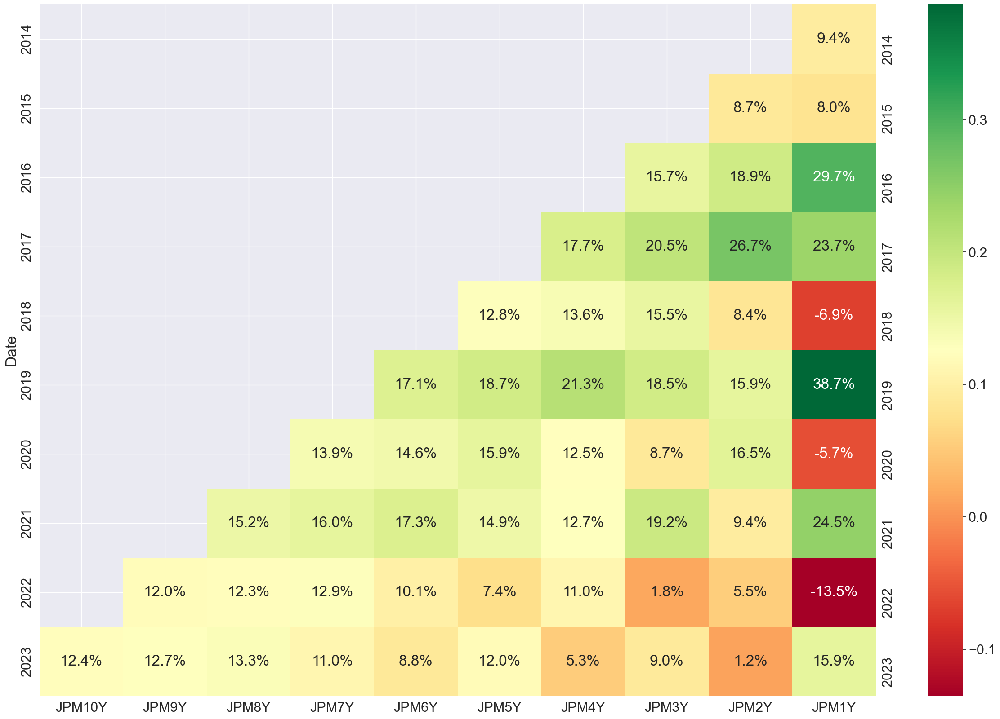

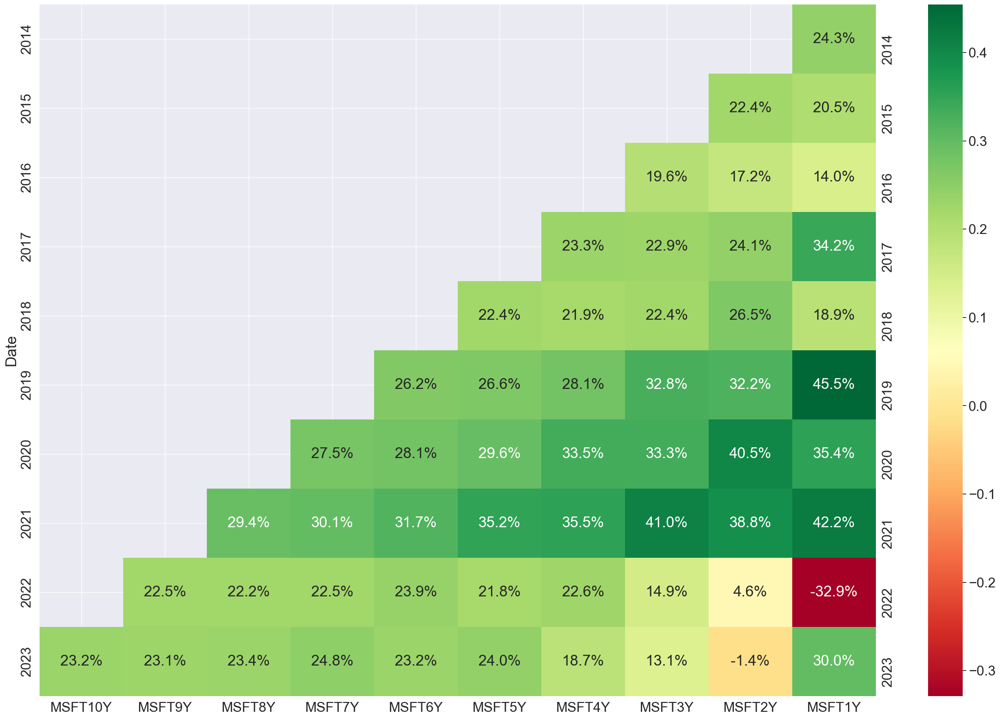

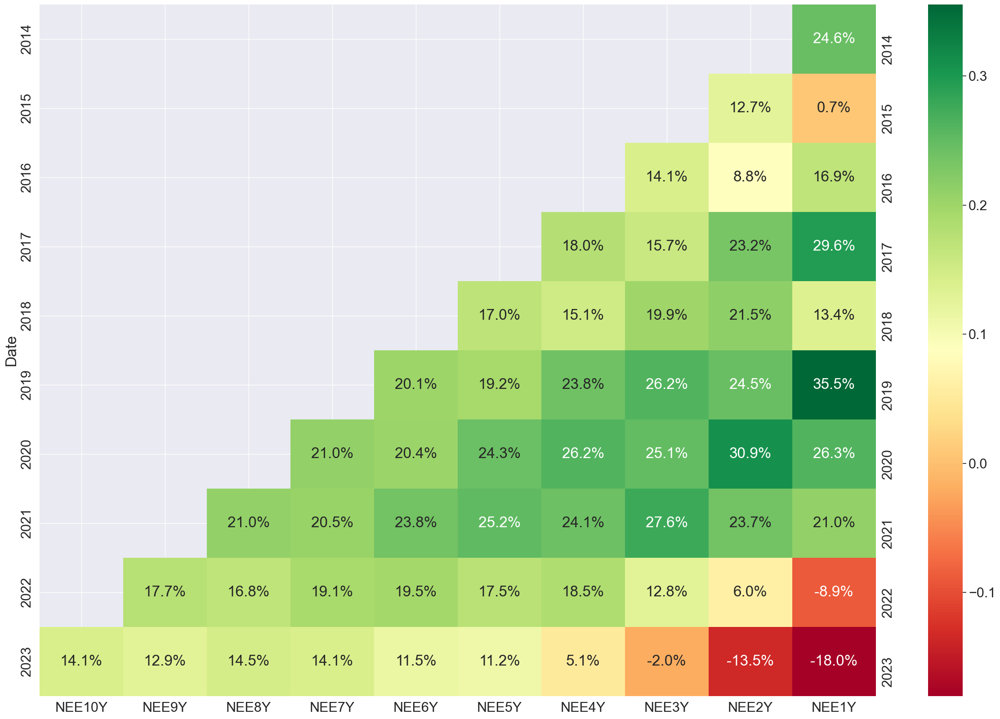

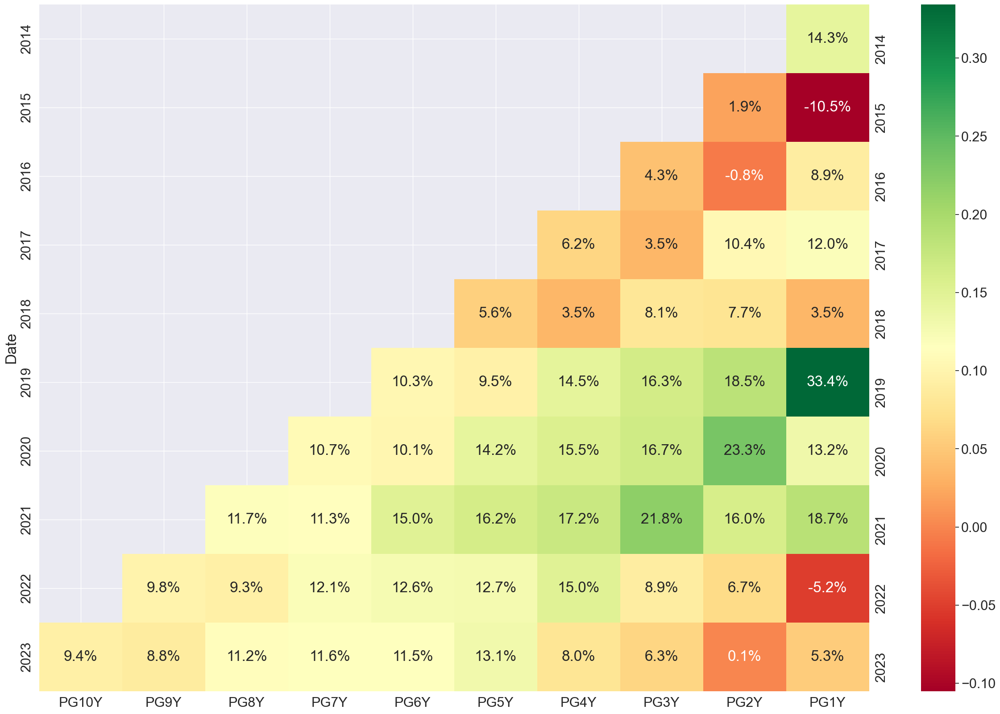

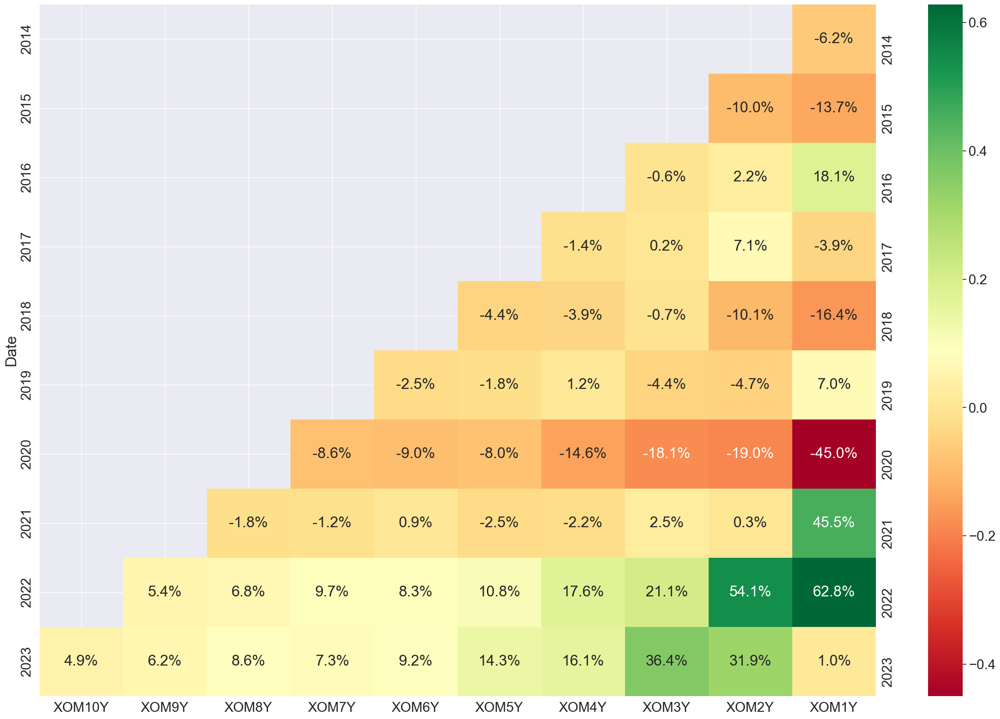

In [25]:
graph_annual_return_triangle(triangle)

In [26]:
norm_data = df_adj_close.div(df_adj_close.iloc[0].mul(100))
norm_data.head()

,JPM,MSFT,NEE,PG,XOM
Date,,,,,
2013-08-12,0.010000,0.010000,0.010000,0.010000,0.010000
2013-08-13,0.010037,0.009874,0.009943,0.010005,0.009945
2013-08-14,0.010011,0.009911,0.009863,0.009955,0.009895
2013-08-15,0.009852,0.009740,0.009697,0.009860,0.009808
2013-08-16,0.009852,0.009743,0.009598,0.009789,0.009780


In [27]:
# Calculating the daily returns
daily_returns = norm_data.pct_change()

In [28]:
daily_returns.head()

,JPM,MSFT,NEE,PG,XOM
Date,,,,,
2013-08-12,NaN,NaN,NaN,NaN,NaN
2013-08-13,0.003698,-0.012561,-0.005725,0.000490,-0.005451
2013-08-14,-0.002578,0.003723,-0.007990,-0.005021,-0.005033
2013-08-15,-0.015882,-0.017310,-0.016821,-0.009477,-0.008881
2013-08-16,0.000000,0.000314,-0.010240,-0.007207,-0.002835


In [29]:
# Calculate cumulative returns
cumulative_returns = (1 + daily_returns).cumprod()

In [30]:
# Calculating the annual returns
annual_returns = cumulative_returns.iloc[-1] - 1

In [31]:
# Calculating the log returns for each stock
log_returns_1 = np.log(norm_data / norm_data.shift(1))
log_returns_1 = log_returns_1.dropna()

In [32]:
# Calculating the covariance matrix of log returns
cov_matrix = log_returns_1.cov() * 252 

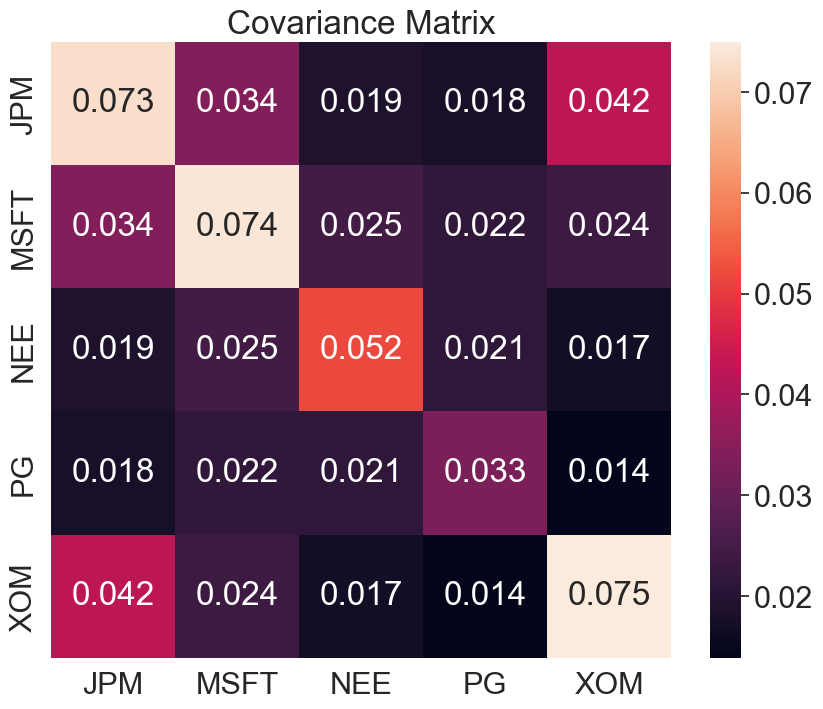

In [33]:
#Ploting the Covariance Matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cov_matrix, annot=True,)
plt.title('Covariance Matrix')
plt.show()

In [34]:
# Assuming the Initial equal weights 
initial_weights = np.array([0.2, 0.2, 0.2, 0.2, 0.2]) 

In [35]:
# Calculating portfolio volatility
def portfolio_volatility(weights, cov_matrix):
    return np.sqrt(np.dot(weights.T, np.dot(cov_matrix, weights)))

In [36]:
# Constraints for optimization
constraints = [{'type': 'eq', 'fun': lambda w: np.sum(w) - 1.0}]

In [37]:
# Minimising the results
result = minimize(portfolio_volatility, initial_weights, args=(cov_matrix,), method='SLSQP', constraints=constraints)

In [38]:
# Extracting the optimized weights and portfolio return
optimized_weights = result.x
portfolio_return = np.sum(optimized_weights * log_returns_1.mean() * 252)

In [39]:
# Printing the results
print("Weighting of each security at minimum volatility:", optimized_weights)
print("Portfolio Return at minimum volatility:", portfolio_return)

Weighting of each security at minimum volatility: [0.06539548 0.05489098 0.18642205 0.53869187 0.15459962]
Portfolio Return at minimum volatility: 0.10934005272757227


In [40]:
# Calculate negative portfolio volatility (to maximize volatility)
def neg_portfolio_volatility(weights, cov_matrix):
    return -np.sqrt(np.dot(weights.T, np.dot(cov_matrix, weights)))

In [41]:
# Constraints for optimization
constraints = [{'type': 'eq', 'fun': lambda w: np.sum(w) - 1.0}]

In [42]:
# Minimising the results
result = minimize(portfolio_volatility, initial_weights, args=(cov_matrix,), method='SLSQP', constraints=constraints)

In [43]:
# Extracting the optimized weights and portfolio return
optimized_weights = result.x
portfolio_return = np.sum(optimized_weights * log_returns_1.mean() * 252)
portfolio_risk = portfolio_volatility(optimized_weights, cov_matrix)

In [44]:
# Printing the results
print("Weighting of each security at maxvolatility:", optimized_weights)
print("Portfolio Return:", portfolio_return)
print("Portfolio Risk :", portfolio_risk)

Weighting of each security at maxvolatility: [0.06539548 0.05489098 0.18642205 0.53869187 0.15459962]
Portfolio Return: 0.10934005272757227
Portfolio Risk : 0.1621957643229456


## Monte-Carlo simulation

In [45]:
def simulate_stock_price(ticker):
    df = yf.download(ticker, period='5y')['Adj Close'].to_frame()

    log_returns = np.log(df / df.shift(1))
    u = log_returns.mean().values
    var = log_returns.var().values
    stdev = log_returns.std().values
    drift = u - (0.5 * var)
    
    t_intervals = 252
    iterations = 50
    z = norm.ppf(np.random.rand(t_intervals, iterations))
    daily_returns = np.exp(drift + stdev * z)
    
    s0 = df.iloc[-1].values
    price_list = np.zeros_like(daily_returns)
    price_list[0] = s0

    for t in range(1, t_intervals):
        price_list[t] = price_list[t-1] * daily_returns[t]

    plt.figure(figsize=(10, 6))
    plt.title(f"Simulation for {ticker}")
    plt.plot(price_list)
    plt.show()

    stats = {
        "Mean": price_list.mean(),
        "Max": price_list.max(),
        "Min": price_list.min(),
        "5th percentile": np.percentile(price_list, 5),
        "95th percentile": np.percentile(price_list, 95)
    }
    
    for key, value in stats.items():
        print(f"{key} for {ticker} is {value}")

[*********************100%***********************]  1 of 1 completed


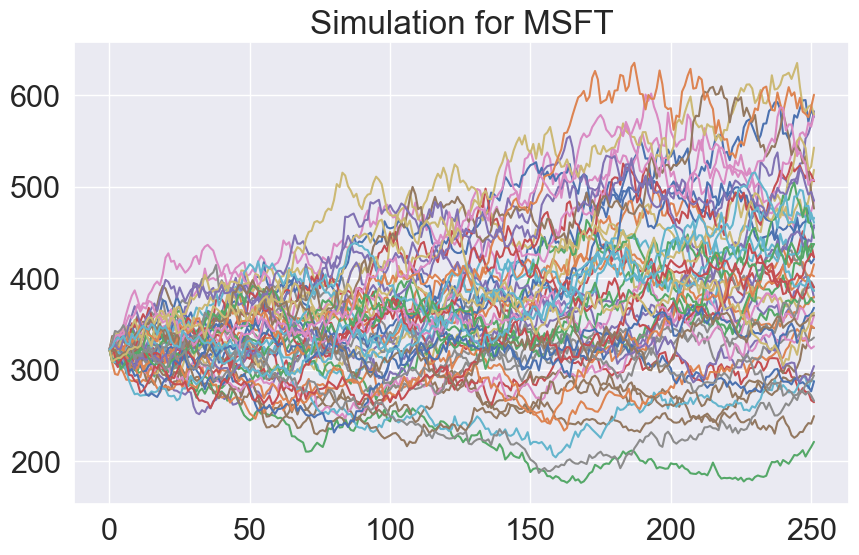

Mean for MSFT is 361.0959001489733
Max for MSFT is 635.3569057243803
Min for MSFT is 176.49580183543398
5th percentile for MSFT is 250.6004627672147
95th percentile for MSFT is 510.72363842531416
[*********************100%***********************]  1 of 1 completed


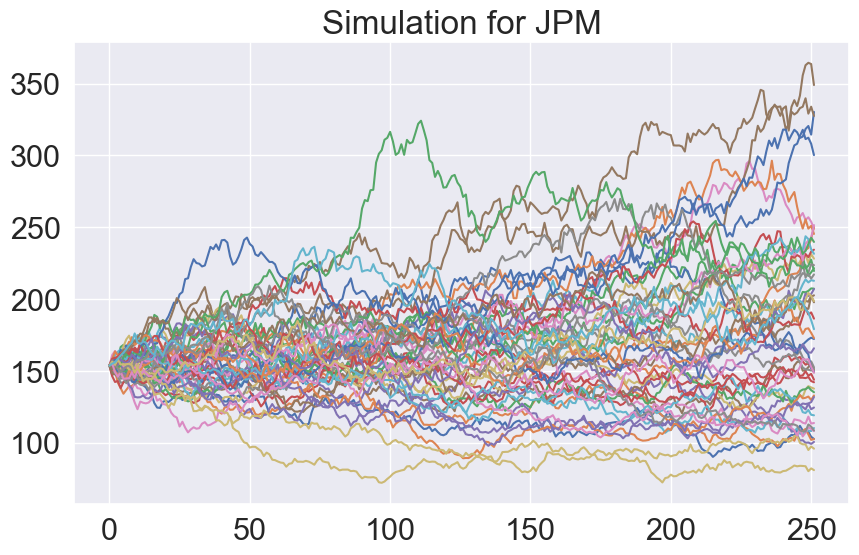

Mean for JPM is 165.5588364220922
Max for JPM is 364.4971031158821
Min for JPM is 72.24830867025595
5th percentile for JPM is 108.75936156063248
95th percentile for JPM is 242.976954067591
[*********************100%***********************]  1 of 1 completed


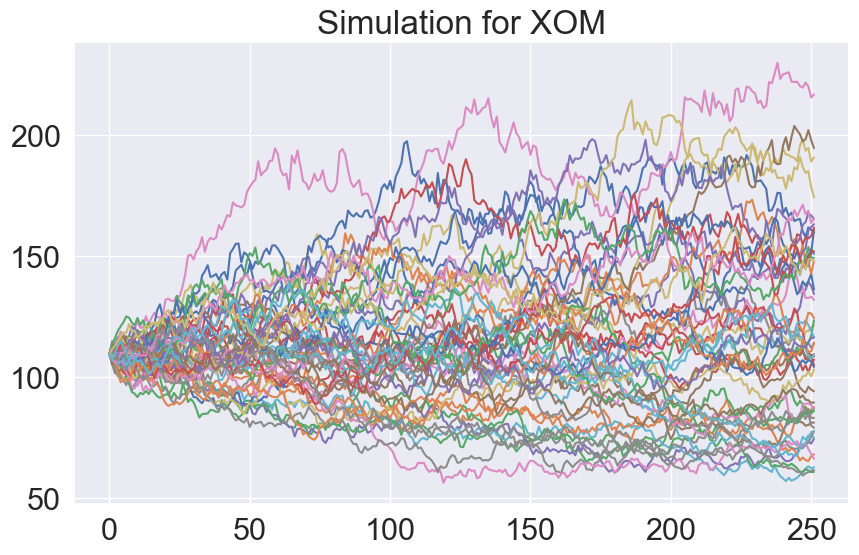

Mean for XOM is 114.29755044502096
Max for XOM is 229.86231952479596
Min for XOM is 56.32037750846404
5th percentile for XOM is 71.58928552346859
95th percentile for XOM is 169.84075509833272
[*********************100%***********************]  1 of 1 completed


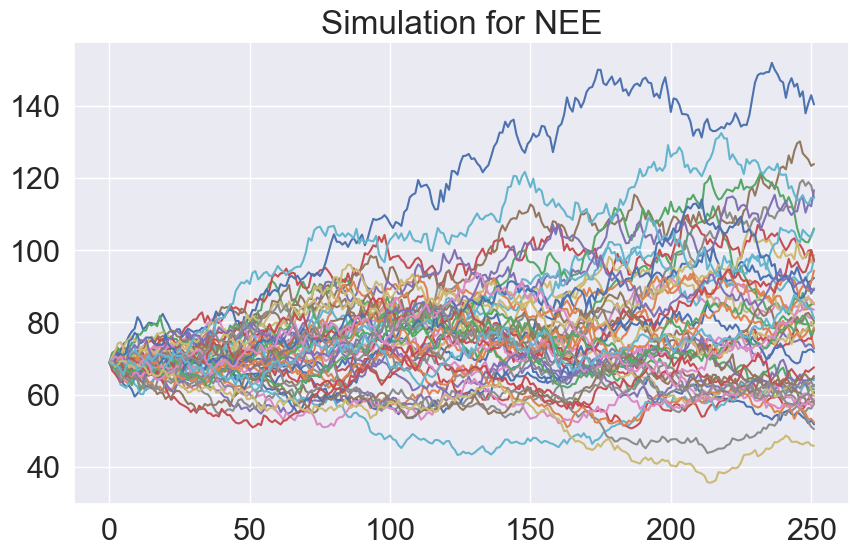

Mean for NEE is 75.3379592223651
Max for NEE is 151.88289120399793
Min for NEE is 35.5541236519193
5th percentile for NEE is 56.170461515802636
95th percentile for NEE is 104.76807422131266
[*********************100%***********************]  1 of 1 completed


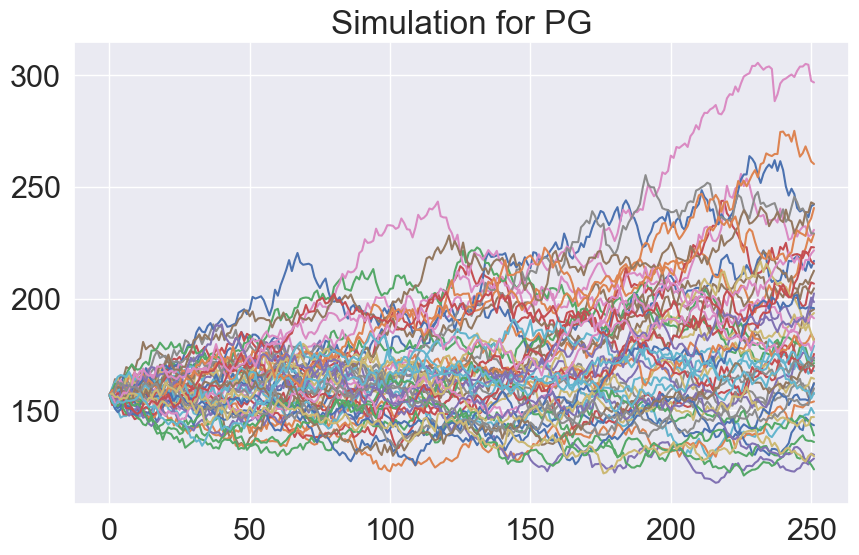

Mean for PG is 169.1960734298473
Max for PG is 305.51144712156685
Min for PG is 117.57436951497617
5th percentile for PG is 135.23169459198724
95th percentile for PG is 218.0017046171284


In [46]:
# List of tickers
tickers = ("MSFT","JPM", "XOM", "NEE","PG")
for ticker in tickers:
    simulate_stock_price(ticker)